# Proyecto de object detection: conducción autónoma


# 1. Utilizando un dataset de object detection: Importando el dataset de conducción autónoma.

In [ ]:
!pip install opencv-python-headless==4.4.0.44

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.9/88.9 MB 7.3 MB/s eta 0:00:00
  error: subprocess-exited-with-error
  
  × pip subprocess to install build dependencies did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Installing build dependencies ... error
error: subprocess-exited-with-error

× pip subprocess to install build dependencies did not run successfully.
│ exit code: 1
╰─> See above for output.

note: This error originates from a subprocess, and is likely not a problem with pip.


In [ ]:
import os
import pathlib
import random
import cv2
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

In [ ]:
!git clone https://github.com/tensorflow/models

fatal: destination path 'models' already exists and is not an empty directory.


In [ ]:
%%bash
cd models/research/
protoc object_detection/protos/*.proto --python_out=.
cp object_detection/packages/tf2/setup.py .
python -m pip install .

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Processing /content/models/research
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Using cached protobuf-4.23.3-cp37-abi3-manylinux2014_x86_64.whl (304 kB)
  Created wheel for object-detection: filename=object_detection-0.1-py3-none-any.whl size=1696986 sha256=cf596b5bee09e53a3603631df7444e22a8c935f5498b56b57e229abd2d77e42c
  Stored in directory: /tmp/pip-ephem-wheel-cache-vvc7we6v/wheels/53/dd/70/2de274d6c443c69d367bd6a5606f95e5a6df61aacf1435ec0d
Successfully built object-detection
  Attempting uninstall: protobuf
    Found existing installation: protobuf 3.20.0
    Uninstalling protobuf-3.20.0:
      Successfully uninstalled protobuf-3.20.0
  Attempting uninstall: object-detection
    Found existing installation: object-detection 0.1
    Uninstalling object-detection-0.1:
      Successfully uninstalled object-detection-0.1


In [ ]:
!pip install tensorflow==2.9.0

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 511.7/511.7 MB 2.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 32.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.6/42.6 kB 3.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.8/5.8 MB 33.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 438.7/438.7 kB 18.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 18.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.9/4.9 MB 25.6 MB/s eta 0:00:00
  Attempting uninstall: keras
    Found existing installation: keras 2.12.0
    Uninstalling keras-2.12.0:
      Successfully uninstalled keras-2.12.0
  Attempting uninstall: flatbuffers
    Found existing installation: flatbuffers 23.3.3
    Uninstalling flatbuffers-23.3.3:
      Successfully uninstalled flatbuffers-23.3.3
  Attempting unin

In [ ]:
from object_detection.utils import visualization_utils as viz_utils

In [ ]:
import tensorflow as tf

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!unzip '/content/drive/MyDrive/archive.zip'

Se han truncado las últimas 5000 líneas del flujo de salida.
  inflating: images/1479502279230178611.jpg  
  inflating: images/1479502279730506173.jpg  
  inflating: images/1479502280230536426.jpg  
  inflating: images/1479502280730839737.jpg  
  inflating: images/1479502281729824146.jpg  
  inflating: images/1479502282229848985.jpg  
  inflating: images/1479502282730102580.jpg  
  inflating: images/1479502283731724690.jpg  
  inflating: images/1479502284232432719.jpg  
  inflating: images/1479502285221790200.jpg  
  inflating: images/1479502285730163274.jpg  
  inflating: images/1479502286231098378.jpg  
  inflating: images/1479502287230097438.jpg  
  inflating: images/1479502287730246905.jpg  
  inflating: images/1479502288231261057.jpg  
  inflating: images/1479502288731301852.jpg  
  inflating: images/1479502289730529475.jpg  
  inflating: images/1479502290232668314.jpg  
  inflating: images/1479502291230742118.jpg  
  inflating: images/1479502292231318149.jpg  
  inflating: images

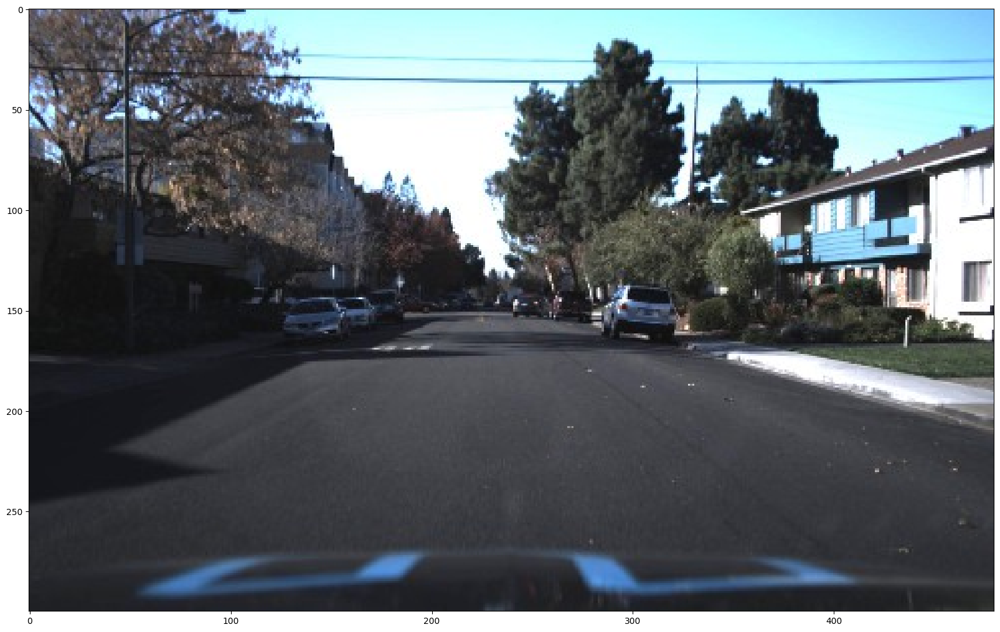

In [ ]:
%matplotlib inline
plt.figure(figsize=(20, 20))
img = cv2.imread('images/1479506176491553178.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img)

# 2. Utilizando un dataset de object detection: visualización del dataset de conducción autónoma

In [ ]:
df = pd.read_csv('labels_train.csv')
df

,frame,xmin,xmax,ymin,ymax,class_id
0,1478019952686311006.jpg,237,251,143,155,1
1,1478019952686311006.jpg,437,454,120,186,3
2,1478019953180167674.jpg,218,231,146,158,1
3,1478019953689774621.jpg,171,182,141,154,2
4,1478019953689774621.jpg,179,191,144,155,1
...,...,...,...,...,...,...
132401,1479506176491553178.jpg,166,186,139,156,1
132402,1479506176491553178.jpg,182,204,142,153,1
132403,1479506176491553178.jpg,239,261,139,155,1
132404,1479506176491553178.jpg,259,280,139,157,1


In [ ]:
print(img.shape)

(300, 480, 3)


In [ ]:
gt_boxes={}
for index, row in df.iterrows():
  if row['class_id'] == 3:
    bbox = np.array([[row['ymin']/300, row['xmin']/480, row['ymax']/300, row['xmax']/480]], dtype=np.float32)
    if row['frame'] in gt_boxes:
      gt_boxes[row['frame']] = np.append(gt_boxes[row['frame']], np.array(bbox), axis =0)
    else:
      gt_boxes[row['frame']] = np.array(bbox)

In [ ]:
my_path = 'images/'
train_images_np = []

for image in gt_boxes.keys():
  im = cv2.imread(my_path + image)
  im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
  train_images_np.append(im)

In [ ]:
pedestrain_class_id = 1
num_classes = 1

category_index = {
    num_classes: {
        'id' : pedestrain_class_id,
        'name': 'pedestrian'
    }
}

# 3. Utilizando un dataset de object detection: visualización final

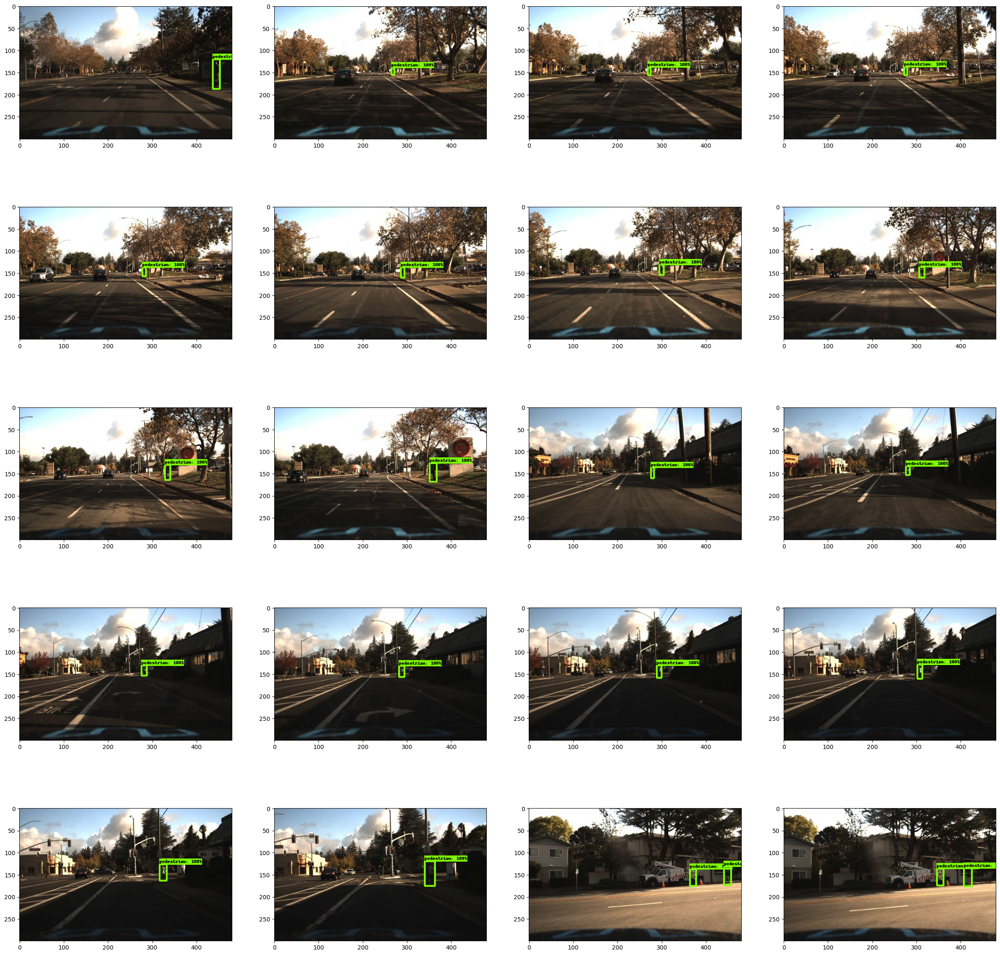

In [ ]:
def plot_detections(image_np, boxes, classes, scores, category_index):
  image_np_with_annotations = image_np.copy()
  viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_annotations,
      boxes,
      classes,
      scores,
      category_index,
      use_normalized_coordinates=True,
      min_score_thresh=0.5
  )
  plt.imshow(image_np_with_annotations)

plt.figure(figsize=(30, 30))
for idx in range(0, 20):
  bboxes = list(gt_boxes.values())[idx]
  dummy_scores = np.ones(shape=[bboxes.shape[0]], dtype=np.float32)
  plt.subplot(5, 4, idx+1)
  plot_detections(
      train_images_np[idx],
      bboxes,
      np.ones(shape=[bboxes.shape[0]], dtype=np.int32),
      dummy_scores,
      category_index
  )

plt.show()

# Aumentado de datos con Albumentations

In [ ]:
!pip install albumentations==1.3.1
!pip install -U scikit-image

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 125.7/125.7 kB 3.3 MB/s eta 0:00:00
  Attempting uninstall: albumentations
    Found existing installation: albumentations 1.2.1
    Uninstalling albumentations-1.2.1:
      Successfully uninstalled albumentations-1.2.1
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 77.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.4/3.4 MB 93.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 313.2/313.2 kB 35.4 MB/s eta 0:00:00
  Attempting uninstall: pillow
    Found existing installation: Pillow 8.4.0
    Uninstalling Pillow-8.4.0:
      Successfully uninstalled Pillow-8.4.0
  Attempting uninstall: imageio
    Found existing installation: imageio 2.25.1
    Uninstalling imageio-2.25.1:
      Successfully uninstalled 

In [ ]:
#!pip show albumentations

In [ ]:
import albumentations as A

In [ ]:
transforms = A.Compose([
                        A.HorizontalFlip(p=0.8),
                        A.RandomBrightnessContrast(p=0.8)
], bbox_params=A.BboxParams(format='albumentations'))

In [ ]:
transforms

Compose([
  HorizontalFlip(always_apply=False, p=0.8),
  RandomBrightnessContrast(always_apply=False, p=0.8, brightness_limit=(-0.2, 0.2), contrast_limit=(-0.2, 0.2), brightness_by_max=True),
], p=1.0, bbox_params={'format': 'albumentations', 'label_fields': None, 'min_area': 0.0, 'min_visibility': 0.0, 'min_width': 0.0, 'min_height': 0.0, 'check_each_transform': True}, keypoint_params=None, additional_targets={}, is_check_shapes=True)

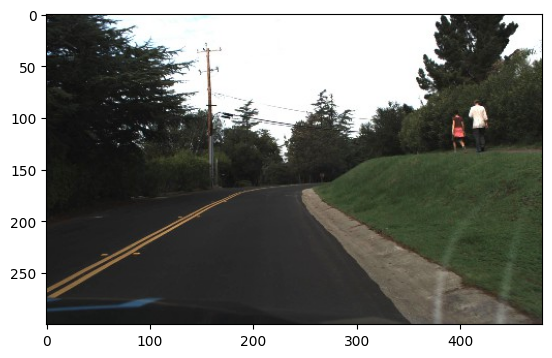

In [ ]:
plt.figure()
plt.imshow(train_images_np[0])

In [ ]:
bbox = list(gt_boxes.values())[0][0]
print(bbox)

[0.4        0.91041666 0.62       0.9458333 ]


In [ ]:
bbox = [bbox[1], bbox[0], bbox[3], bbox[2]]

In [ ]:
bbox.append('pedestrian')

In [ ]:
bbox = [bbox]

In [ ]:
trasformed_image_1 = transforms(image=train_images_np[0], bboxes=bbox)
trasformed_image_2 = transforms(image=train_images_np[0], bboxes=bbox)
trasformed_image_3 = transforms(image=train_images_np[0], bboxes=bbox)

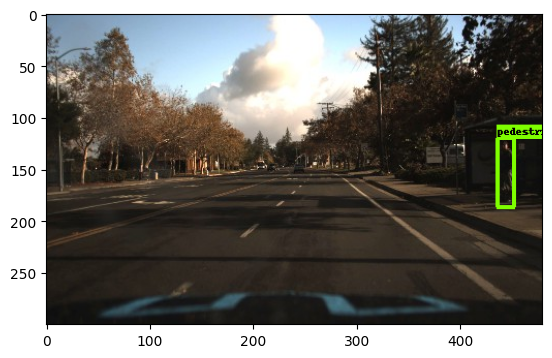

In [ ]:
plt.figure()

plot_detections(
    train_images_np[0],
    np.array([list(gt_boxes.values())[0][0]]),
    np.ones(shape=[1], dtype=np.int32),
    dummy_scores,
    category_index
)

In [ ]:
transformed_bbox_1 = (list(trasformed_image_1['bboxes'][0])[:-1])

In [ ]:
transformed_bbox_1 = [transformed_bbox_1[1], transformed_bbox_1[0], transformed_bbox_1[3], transformed_bbox_1[2]]

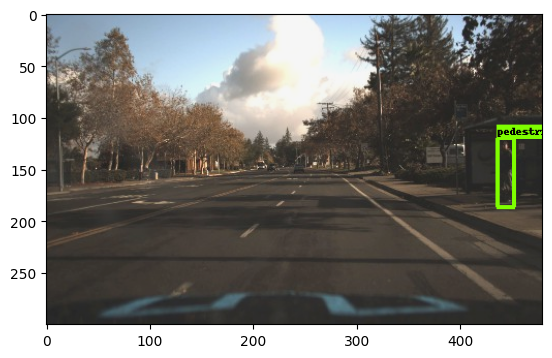

In [ ]:
plt.figure()
plot_detections(
    trasformed_image_1['image'],
    np.array([transformed_bbox_1]),
    np.ones(shape=[1], dtype=np.int32),
    dummy_scores,
    category_index
)

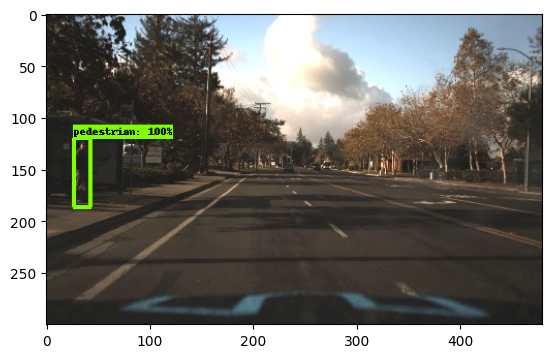

In [ ]:
transformed_bbox_2 = (list(trasformed_image_2['bboxes'][0])[:-1])
transformed_bbox_2 = [transformed_bbox_2[1], transformed_bbox_2[0], transformed_bbox_2[3], transformed_bbox_2[2]]
plt.figure()
plot_detections(
    trasformed_image_2['image'],
    np.array([transformed_bbox_2]),
    np.ones(shape=[1], dtype=np.int32),
    dummy_scores,
    category_index
)

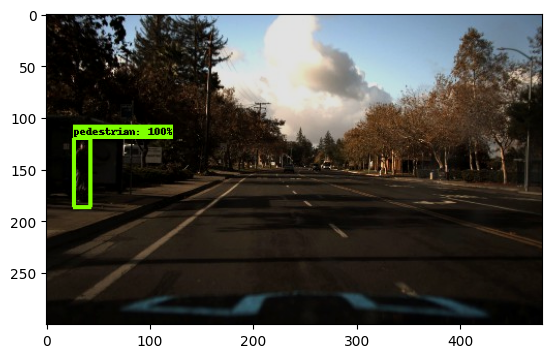

In [ ]:
transformed_bbox_3 = (list(trasformed_image_3['bboxes'][0])[:-1])
transformed_bbox_3 = [transformed_bbox_3[1], transformed_bbox_3[0], transformed_bbox_3[3], transformed_bbox_3[2]]
plt.figure()
plot_detections(
    trasformed_image_3['image'],
    np.array([transformed_bbox_3]),
    np.ones(shape=[1], dtype=np.int32),
    dummy_scores,
    category_index
)

# 5. Utilizando un modelo de object detection pre-entrenado.

In [ ]:
!wget  http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_resnet50_v1_fpn_640x640_coco17_tpu-8.tar.gz
!tar -xf ssd_resnet50_v1_fpn_640x640_coco17_tpu-8.tar.gz
!mv ssd_resnet50_v1_fpn_640x640_coco17_tpu-8/checkpoint models/research/object_detection/test_data/



--2023-06-23 02:02:50--  http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_resnet50_v1_fpn_640x640_coco17_tpu-8.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 173.194.213.128, 2607:f8b0:400c:c0a::80
Connecting to download.tensorflow.org (download.tensorflow.org)|173.194.213.128|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 244817203 (233M) [application/x-tar]
Saving to: ‘ssd_resnet50_v1_fpn_640x640_coco17_tpu-8.tar.gz.2’

ssd_resnet50_v1_fpn 100%[===================>] 233.48M   180MB/s    in 1.3s    

2023-06-23 02:02:52 (180 MB/s) - ‘ssd_resnet50_v1_fpn_640x640_coco17_tpu-8.tar.gz.2’ saved [244817203/244817203]

mv: cannot move 'ssd_resnet50_v1_fpn_640x640_coco17_tpu-8/checkpoint' to 'models/research/object_detection/test_data/checkpoint': Directory not empty


In [ ]:
pip install protobuf==3.20

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 15.3 MB/s eta 0:00:00
  Attempting uninstall: protobuf
    Found existing installation: protobuf 4.23.3
    Uninstalling protobuf-4.23.3:
      Successfully uninstalled protobuf-4.23.3
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
apache-beam 2.48.0 requires protobuf<4.24.0,>=3.20.3, but you have protobuf 3.20.0 which is incompatible.
google-api-core 2.11.0 requires protobuf!=3.20.0,!=3.20.1,!=4.21.0,!=4.21.1,!=4.21.2,!=4.21.3,!=4.21.4,!=4.21.5,<5.0.0dev,>=3.19.5, but you have protobuf 3.20.0 which is incompatible.
google-cloud-bigquery 3.9.0 requires protobuf!=3.20.0,!=3.20.1,!=4.21.0,!=4.21.1,!=4.21.2,!=4.21.3,!=4.21.4,!=4.21.5,<5.0.0dev,>=3.19.5, but you have protobuf 3.20.0 which is incompatible.
googl

In [ ]:
from object_detection.utils import config_util
from object_detection.builders import model_builder

/usr/local/lib/python3.10/dist-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(


In [ ]:
model_name = 'ssd_resnet50_v1_fpn_640x640_coco17_tpu-8'
pipeline_config = os.path.join('models/research/object_detection/configs/tf2/' + model_name + '.config')
model_dir = 'models/research/object_detection/test_data/checkpoint/'

In [ ]:
configs = config_util.get_configs_from_pipeline_file(pipeline_config)
model_config = configs['model']
detection_model = model_builder.build(model_config=model_config, is_training=False)

In [ ]:
ckpt = tf.compat.v2.train.Checkpoint(model=detection_model)
ckpt.restore(os.path.join(model_dir, 'ckpt-0')).expect_partial()

In [ ]:
def get_model_detection_function(model):

  @tf.function
  def detect_fn(image):
    image, shape = model.preprocess(image)
    prediction_dict = model.predict(image, shape)
    detections = model.postprocess(prediction_dict, shape)

    return detections

  return detect_fn

detect_fn = get_model_detection_function(detection_model)

In [ ]:
from object_detection.utils import label_map_util

label_map_path = configs['eval_input_config'].label_map_path
label_map_path = 'models/research/object_detection/data/mscoco_label_map.pbtxt'

label_map = label_map_util.load_labelmap(label_map_path)
categories = label_map_util.convert_label_map_to_categories(
    label_map,
    max_num_classes=label_map_util.get_max_label_map_index(label_map),
    use_display_name=True
)

category_index = label_map_util.create_category_index(categories)
label_map_dict = label_map_util.get_label_map_dict(label_map, use_display_name=True)

In [ ]:
%matplotlib inline

img = cv2.imread('images/1479506176491553178.jpg')
image_np = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)


In [ ]:
input_tensor = tf.convert_to_tensor(
    np.expand_dims(image_np, 0), dtype=tf.float32
)
detections = detect_fn(input_tensor)

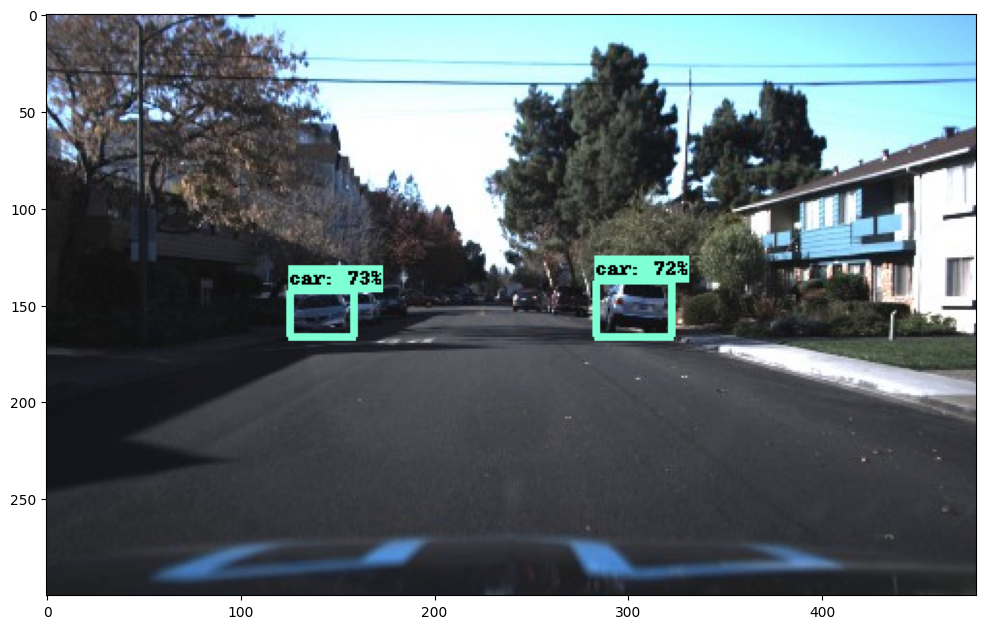

In [ ]:
label_id_offset = 1
image_np_with_detections = image_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
    image_np_with_detections,
    detections['detection_boxes'][0].numpy(),
    (detections['detection_classes'][0].numpy() + label_id_offset).astype(int),
    detections['detection_scores'][0].numpy(),
    category_index,
    use_normalized_coordinates=True,
    min_score_thresh=0.7
)

plt.figure(figsize=(12, 16))
plt.imshow(image_np_with_detections)
plt.show()

# 6. Fine-tuning en object detection

In [ ]:
from object_detection.utils import config_util
from object_detection.builders import model_builder


In [ ]:
num_classes = 1
pipeline_config = 'models/research/object_detection/configs/tf2/ssd_resnet50_v1_fpn_640x640_coco17_tpu-8.config'
checkpoint_path = 'models/research/object_detection/test_data/checkpoint/ckpt-0'

In [ ]:
configs = config_util.get_configs_from_pipeline_file(pipeline_config)
model_config = configs['model']


In [ ]:
model_config.ssd.num_classes = num_classes
model_config.ssd.freeze_batchnorm = True
detection_model = model_builder.build(model_config=model_config, is_training=True)

In [ ]:
fake_box_predictor = tf.compat.v2.train.Checkpoint(
    _base_tower_layers_for_heads = detection_model._box_predictor._base_tower_layers_for_heads,
    _box_prediction_head=detection_model._box_predictor._box_prediction_head
)

In [ ]:
fake_model = tf.compat.v2.train.Checkpoint(
    _feature_extractor=detection_model.feature_extractor,
    _box_predictor=fake_box_predictor
)

In [ ]:
ckpt = tf.compat.v2.train.Checkpoint(model=fake_model)

In [ ]:
ckpt.restore(checkpoint_path).expect_partial()

In [ ]:
image, shapes = detection_model.preprocess(tf.zeros([1, 640, 640, 3]))

In [ ]:
prediction_dict = detection_model.predict(image, shapes)

In [ ]:
_ = detection_model.postprocess(prediction_dict, shapes)

In [ ]:
df = pd.read_csv('labels_train.csv')
df

,frame,xmin,xmax,ymin,ymax,class_id
0,1478019952686311006.jpg,237,251,143,155,1
1,1478019952686311006.jpg,437,454,120,186,3
2,1478019953180167674.jpg,218,231,146,158,1
3,1478019953689774621.jpg,171,182,141,154,2
4,1478019953689774621.jpg,179,191,144,155,1
...,...,...,...,...,...,...
132401,1479506176491553178.jpg,166,186,139,156,1
132402,1479506176491553178.jpg,182,204,142,153,1
132403,1479506176491553178.jpg,239,261,139,155,1
132404,1479506176491553178.jpg,259,280,139,157,1


In [ ]:
gt_boxes = []
images_added = []
images_multi_bbox = set()

for index, row in df.iterrows():
  if row['frame'] not in images_added and row['class_id'] == 3:
    images_added.append(row['frame'])
    bbox = np.array([[row['ymin']/300, row['xmin']/480, row['ymax']/300, row['xmax']/480]], dtype=np.float32)
    gt_boxes.append(bbox)
  else:
    images_multi_bbox.add(row['frame'])



In [ ]:
id_x_to_delete = []
for x, image in enumerate(images_added):
  if image in images_multi_bbox:
    id_x_to_delete.append(x)

In [ ]:
new_gt_boxes = []
new_images_added = []
for x, gt_box in enumerate(gt_boxes):
  if x not in  id_x_to_delete:
    new_gt_boxes.append(gt_box)


In [ ]:
for x, image_added in enumerate(images_added):
  if x not in id_x_to_delete:
    new_images_added.append(image_added)

In [ ]:
gt_boxes = new_gt_boxes
images_added = new_images_added

In [ ]:
my_path = 'images/'
train_images_np = []
print(len(images_added))
for image in images_added:
  im = cv2.imread(my_path+ image)
  im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
  train_images_np.append(im)

21


In [ ]:
label_id_offset = 1
train_image_tensors = []
gt_classes_one_hot_tensors = []
gt_box_tensors = []
for (train_image_np, gt_box_np) in zip(train_images_np, gt_boxes):
  train_image_tensors.append(tf.expand_dims(tf.convert_to_tensor(train_image_np, dtype=tf.float32), axis=0))
  gt_box_tensors.append(tf.convert_to_tensor(gt_box_np, dtype=tf.float32))
  zero_indexed_ground_truth_classes = tf.convert_to_tensor(np.ones([gt_box_np.shape[0]], dtype=np.int32)-label_id_offset)
  gt_classes_one_hot_tensors.append(tf.one_hot(zero_indexed_ground_truth_classes, num_classes))

In [ ]:
print(len(train_image_tensors))

21


In [ ]:
tf.keras.backend.set_learning_phase(True)

/usr/local/lib/python3.10/dist-packages/keras/backend.py:452: UserWarning: `tf.keras.backend.set_learning_phase` is deprecated and will be removed after 2020-10-11. To update it, simply pass a True/False value to the `training` argument of the `__call__` method of your layer or model.
  warnings.warn(


In [ ]:
batch_size = 10
learning_rate= 0.01
num_batches = 200

In [ ]:
trainable_variables = detection_model.trainable_variables
to_fine_tune = []
prefixes_to_train = [
  'WeightSharedConvolutionalBoxPredictor/WeightSharedConvolutionalBoxHead',
  'WeightSharedConvolutionalBoxPredictor/WeightSharedConvolutionalClassHead'
]


for var in trainable_variables:
  if any([var.name.startswith(prefix) for prefix in prefixes_to_train]):
    to_fine_tune.append(var)

In [ ]:
def get_model_train_step_function(model, optimizer, vars_to_fine_tune):

  @tf.function
  def train_step_fn(image_tensors,
                    groundtruth_boxes_list,
                    groundtruth_classes_list):
    shapes = tf.constant(batch_size * [[640, 640, 3]], dtype=tf.int32)
    model.provide_groundtruth(
        groundtruth_boxes_list=groundtruth_boxes_list,
        groundtruth_classes_list=groundtruth_classes_list
    )

    with tf.GradientTape() as tape:
      preprocessed_images = tf.concat(
          [detection_model.preprocess(image_tensor)[0]
          for image_tensor in image_tensors], axis=0
      )
      prediction_dict = model.predict(preprocessed_images, shapes)
      losses_dict = model.loss(prediction_dict, shapes)
      total_loss = losses_dict['Loss/localization_loss'] + losses_dict['Loss/classification_loss']
      gradients = tape.gradient(total_loss, vars_to_fine_tune)
      optimizer.apply_gradients(zip(gradients, vars_to_fine_tune))

    return total_loss

  return train_step_fn

In [ ]:
optimizer= tf.keras.optimizers.SGD(learning_rate=learning_rate, momentum=0.9)
train_step_fn = get_model_train_step_function(detection_model, optimizer, to_fine_tune)

In [ ]:
def process_data_augmentation(image_list, image_tensors, gt_boxes_list):
  new_train_image_tensors = []
  new_gt_box_tensors = []
  for x, image in enumerate(image_list):
    bbox = [gt_boxes_list[x].numpy()[0][1], gt_boxes_list[x].numpy()[0][0], gt_boxes_list[x].numpy()[0][3], gt_boxes_list[x].numpy()[0][2]]
    bbox.append('pedestrian')
    bbox = [bbox]

    transformed_image_1 = transforms(image=image, bboxes=bbox)
    transformed_bbox = (list(transformed_image_1['bboxes'][0])[:-1])
    transformed_bbox = [transformed_bbox[1], transformed_bbox[0], transformed_bbox[3], transformed_bbox[2]]
    gt_boxes_list[x] = transformed_bbox
    new_train_image_tensors.append(tf.expand_dims(tf.convert_to_tensor(transformed_image_1['image'], dtype =tf.float32), axis=0))
    transformed_bbox = np.array([transformed_bbox])
    new_gt_box_tensors.append(tf.convert_to_tensor(transformed_bbox, dtype=tf.float32))

  return new_train_image_tensors, new_gt_box_tensors


In [ ]:
for idx in range(num_batches):
  all_keys = list(range(len(train_images_np)))
  random.shuffle(all_keys)
  example_keys = all_keys[:batch_size]


  gt_boxes_list = [gt_box_tensors[key] for key in example_keys]
  gt_classes_list = [gt_classes_one_hot_tensors[key] for key in example_keys]
  image_tensors = [train_image_tensors[key] for key in example_keys]
  image_list = [train_images_np[key] for key in example_keys]

  new_train_image_tensors, new_gt_box_tensors = process_data_augmentation(image_list, image_tensors, gt_boxes_list)

  images_tensors = new_train_image_tensors
  gt_boxes_list = new_gt_box_tensors

  total_loss = train_step_fn(images_tensors, gt_boxes_list, gt_classes_list)

  if idx % 10 == 0:
    print('batch ' + str(idx) + ' of ' + str(num_batches) + ', loss= ' + str(total_loss), flush=True)






batch 0 of 200, loss= tf.Tensor(1.7233042, shape=(), dtype=float32)
batch 10 of 200, loss= tf.Tensor(6.6972847, shape=(), dtype=float32)
batch 20 of 200, loss= tf.Tensor(3.8663504, shape=(), dtype=float32)
batch 30 of 200, loss= tf.Tensor(2.725116, shape=(), dtype=float32)
batch 40 of 200, loss= tf.Tensor(0.92917615, shape=(), dtype=float32)
batch 50 of 200, loss= tf.Tensor(0.819928, shape=(), dtype=float32)
batch 60 of 200, loss= tf.Tensor(0.7031656, shape=(), dtype=float32)
batch 70 of 200, loss= tf.Tensor(0.3058033, shape=(), dtype=float32)
batch 80 of 200, loss= tf.Tensor(1.0231773, shape=(), dtype=float32)
batch 90 of 200, loss= tf.Tensor(0.42037636, shape=(), dtype=float32)
batch 100 of 200, loss= tf.Tensor(0.14367408, shape=(), dtype=float32)
batch 110 of 200, loss= tf.Tensor(0.5158866, shape=(), dtype=float32)
batch 120 of 200, loss= tf.Tensor(1.2229488, shape=(), dtype=float32)
batch 130 of 200, loss= tf.Tensor(0.3149911, shape=(), dtype=float32)
batch 140 of 200, loss= tf.Ten

In [ ]:
def detect(input_tensor):
  preprocessed_image, shapes = detection_model.preprocess(input_tensor)
  predict_dict = detection_model.predict(preprocessed_image, shapes)
  return detection_model.postprocess(predict_dict, shapes)

In [ ]:
pedestrian_class_id = 1
num_classes = 1

category_index = {
    num_classes: {
        'id': pedestrian_class_id,
        'name': 'pedestrian'
    }
}

In [ ]:
img = cv2.imread('images/1478900584619750605.jpg')
image_np = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

In [ ]:
input_tensor = tf.convert_to_tensor(
    np.expand_dims(image_np, 0), dtype=tf.float32
)

In [ ]:
detections = detect(input_tensor)

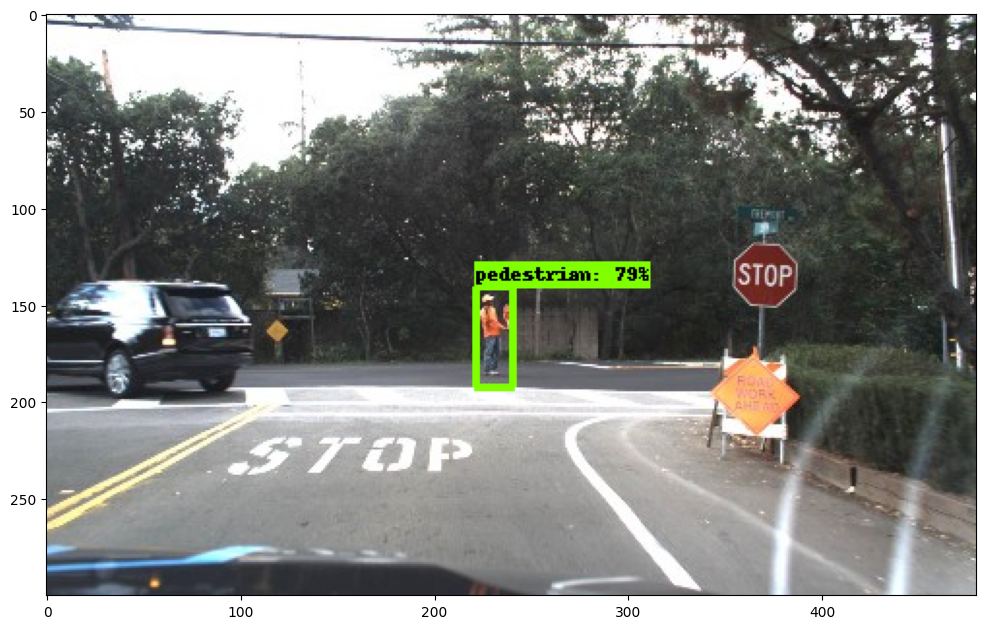

In [ ]:
label_id_offset = 1
image_np_with_detections = image_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
    image_np_with_detections,
    detections['detection_boxes'][0].numpy(),
    (detections['detection_classes'][0].numpy() + label_id_offset).astype(int),
    detections['detection_scores'][0].numpy(),
    category_index,
    use_normalized_coordinates=True,
    min_score_thresh=0.6
)

plt.figure(figsize=(12, 16))
plt.imshow(image_np_with_detections)
plt.show()